#  Daily & Weekly Ingredient Forecasting Module

This module estimates ingredient-level demand at both daily and weekly scales, using predicted order volumes and recipe mappings. It supports prep planning, purchasing, and inventory optimization by translating customer demand into actionable ingredient quantities.

We begin by merging forecasted order volumes with recipe-level ingredient breakdowns, then aggregate by day and week to produce prep-ready ingredient forecasts.


##  Item Metadata Summary: Menu Structure & Prep Complexity

We begin by inspecting the `items.ndjson` file, which defines the menu structure and prep logic:

- **Total items**: number of unique menu entries
- **Category breakdown**: counts by item type (e.g., drinks, sandwiches)
- **Workflow types**: operational prep flows (e.g., hot, cold, baked)
- **Size variants**: items with multiple sizes (e.g., small, medium, large)
- **Topping options**: items that allow customization via toppings

This summary helps estimate prep complexity and guides ingredient mapping for forecasting.


In [17]:
import pandas as pd

# Load items.ndjson
items_df = pd.read_json("items.ndjson", lines=True)

# Total unique items
total_items = len(items_df)
print(f"Total items: {total_items}")

# Count by category
category_counts = items_df['category'].value_counts()
print("\nItems per category:")
print(category_counts)

# Count by workflow
workflow_counts = items_df['workflow'].value_counts()
print("\nItems per workflow:")
print(workflow_counts)

# Items with size options
size_items = items_df[items_df['hasSize'] == True]
num_size_items = len(size_items)
print(f"\nItems with size options: {num_size_items}")

# Estimate total size variants (assuming 3 sizes per item)
estimated_size_variants = num_size_items * 3
print(f"Estimated total size variants: {estimated_size_variants}")

# Items with toppings
topping_items = items_df[items_df['hasToppings'] == True]
num_topping_items = len(topping_items)
print(f"\nItems with topping options: {num_topping_items}")


Total items: 51

Items per category:
category
Pizzas          16
Hot Drinks      11
Desserts        10
Soft Drinks      5
Salades          3
Bakery           3
Other Drinks     2
Gelato           1
Name: count, dtype: int64

Items per workflow:
workflow
BAR      18
OTHER    17
PIZZA    16
Name: count, dtype: int64

Items with size options: 4
Estimated total size variants: 12

Items with topping options: 19


## Pizza Size Distribution from Modifier Usage

To estimate ingredient scaling by pizza size, we analyze `order_items.ndjson` and count how often each size modifier appears:

- We filter `options.ndjson` for known size labels: `"Pâte S"`, `"Pâte M"`, `"Pâte L"`
- We build a lookup from modifier ID to size name
- We iterate through all applied modifiers in `order_items.ndjson`, summing quantities by size

This gives us a breakdown of pizza orders by size, which is essential for proportional ingredient forecasting (e.g., dough, sauce, cheese).


In [18]:
import pandas as pd
from collections import Counter

# Load options.ndjson (modifier definitions)
options_df = pd.read_json("options.ndjson", lines=True)

# Filter for size modifiers by name
size_names = ["Pâte S", "Pâte M", "Pâte L"]
size_mods = options_df[options_df['name'].isin(size_names)]

# Build lookup: modifier_id → name
size_lookup = dict(zip(size_mods['_id'], size_mods['name']))

# Load order_items.ndjson
order_items_df = pd.read_json("order_items.ndjson", lines=True)

# Count usage
size_counter = Counter()

for _, row in order_items_df.iterrows():
    for mod_id in row['appliedOptions']:
        if mod_id in size_lookup:
            size_name = size_lookup[mod_id]
            size_counter[size_name] += row['qty']

# Print results
print("\n🍕 Total Pizza Orders by Size:")
for size in size_names:
    print(f"{size}: {size_counter[size]} orders")



🍕 Total Pizza Orders by Size:
Pâte S: 95538 orders
Pâte M: 95320 orders
Pâte L: 94785 orders


##  Pizza Demand Breakdown by Size and Recipe

To support ingredient scaling, we analyze how each pizza recipe is ordered across size variants:

- We filter `items.ndjson` for pizzas and map item IDs to names
- We extract size modifiers (`Pâte S`, `Pâte M`, `Pâte L`) and link them to scoped pizza IDs
- We iterate through `order_items.ndjson`, counting how often each pizza-size combination appears

This yields a nested dictionary of pizza orders by size, enabling proportional ingredient forecasting (e.g., dough, sauce, toppings) per recipe and size.


In [19]:
import pandas as pd
from collections import defaultdict

# Load data
items_df = pd.read_json("items.ndjson", lines=True)
options_df = pd.read_json("options.ndjson", lines=True)
order_items_df = pd.read_json("order_items.ndjson", lines=True)

# Filter pizza items
pizza_items = items_df[items_df['category'] == 'Pizzas']
pizza_id_to_name = dict(zip(pizza_items['_id'], pizza_items['name']))

# Filter size modifiers
size_names = ['Pâte S', 'Pâte M', 'Pâte L']
size_mods = options_df[options_df['name'].isin(size_names)]

# Build map: modifier_id → (size, pizza_id)
mod_to_size_pizza = []
for _, row in size_mods.iterrows():
    size = row['name']
    for pid in row['itemScope']:
        mod_to_size_pizza.append((row['_id'], size, pid))

# Build lookup: modifier_id → (size, pizza_id)
mod_lookup = {mod_id: (size, pid) for mod_id, size, pid in mod_to_size_pizza}

# Count orders per pizza per size
pizza_size_counts = defaultdict(lambda: defaultdict(int))

for _, row in order_items_df.iterrows():
    item_id = row['itemId']
    qty = row['qty']
    for mod_id in row['appliedOptions']:
        if mod_id in mod_lookup:
            size, pid = mod_lookup[mod_id]
            pizza_name = pizza_id_to_name.get(pid)
            if pizza_name:
                pizza_size_counts[pizza_name][size] += qty
                pizza_size_counts[pizza_name]['total'] += qty

# Print results
print("\n🍕 Pizza Orders by Size:")
for pizza, sizes in pizza_size_counts.items():
    print(f"\n{pizza} (Total: {sizes['total']} orders)")
    for size in ['Pâte S', 'Pâte M', 'Pâte L']:
        print(f"  {size}: {sizes.get(size, 0)} orders")



🍕 Pizza Orders by Size:

Pizza Crevettes (Total: 17998 orders)
  Pâte S: 5975 orders
  Pâte M: 6104 orders
  Pâte L: 5919 orders

Pizza Merguez (Total: 17817 orders)
  Pâte S: 5957 orders
  Pâte M: 5923 orders
  Pâte L: 5937 orders

Pizza 3 Fromages (Total: 17555 orders)
  Pâte S: 5904 orders
  Pâte M: 5814 orders
  Pâte L: 5837 orders

Pizza Chicken (Total: 17830 orders)
  Pâte S: 6039 orders
  Pâte M: 5926 orders
  Pâte L: 5865 orders

Pizza Pepperoni & Tomates (Total: 18213 orders)
  Pâte S: 6099 orders
  Pâte M: 6141 orders
  Pâte L: 5973 orders

Pizza Végétarienne Champignions (Total: 17921 orders)
  Pâte S: 6003 orders
  Pâte M: 6073 orders
  Pâte L: 5845 orders

Pizza Margherita (Total: 17811 orders)
  Pâte S: 6028 orders
  Pâte M: 6007 orders
  Pâte L: 5776 orders

Pizza Poulet Barbecue (Total: 17619 orders)
  Pâte S: 5748 orders
  Pâte M: 5888 orders
  Pâte L: 5983 orders

Pizza Anchovy (Total: 17985 orders)
  Pâte S: 6029 orders
  Pâte M: 6034 orders
  Pâte L: 5922 orders

P

## Visualizing Pizza Demand by Size

To support ingredient scaling and prep planning, we visualize pizza orders by size across all recipes. This horizontal bar chart shows how each pizza type is distributed across small (`Pâte S`), medium (`Pâte M`), and large (`Pâte L`) sizes.

This helps identify:
- High-volume recipes
- Size preferences per pizza
- Potential prep bottlenecks (e.g., dough, oven space)

The chart complements the raw counts and guides proportional ingredient forecasting.


C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\2741409709.py:13: UserWarning: Glyph 127829 (\N{SLICE OF PIZZA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\haithem0\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127829 (\N{SLICE OF PIZZA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


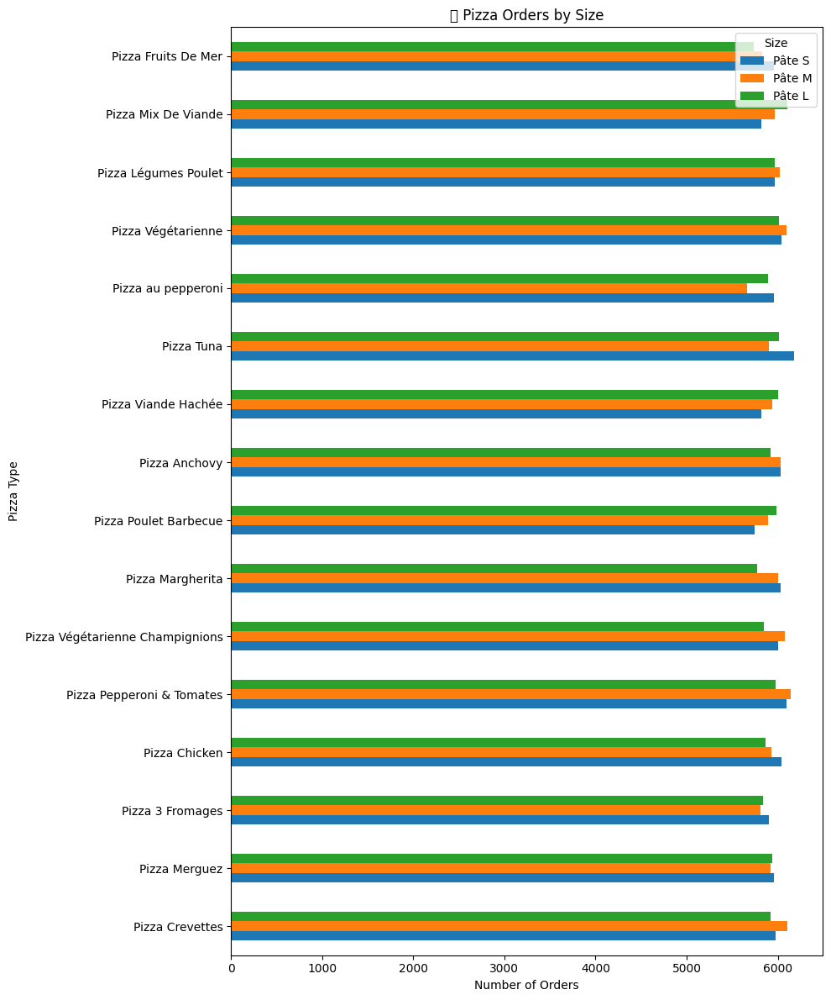

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

# columns = ['Pizza', 'Pâte S', 'Pâte M', 'Pâte L']
df = pd.DataFrame(pizza_size_counts).T.fillna(0)
df = df[['Pâte S', 'Pâte M', 'Pâte L']].astype(int)

df.plot(kind='barh', stacked=False, figsize=(10, 12))
plt.title("🍕 Pizza Orders by Size")
plt.xlabel("Number of Orders")
plt.ylabel("Pizza Type")
plt.legend(title="Size")
plt.tight_layout()
plt.show()


## Extracting Ingredient Forecast Targets

To define the scope of ingredient-level forecasting, we extract all non-size modifiers from `options.ndjson`. These represent toppings, add-ons, and prep components that vary by order.

Steps:
- Exclude size modifiers (`Pâte S`, `Pâte M`, `Pâte L`)
- Filter remaining options as ingredient-level modifiers
- Extract and sort unique ingredient names

This list forms the final set of ingredient forecast targets, which will be scaled by predicted order volume and recipe mappings.


In [21]:
import pandas as pd

# Load options.ndjson
options_df = pd.read_json("options.ndjson", lines=True)

# Define size modifier names to exclude
size_names = ['Pâte S', 'Pâte M', 'Pâte L']

# Filter out size modifiers
ingredient_mods = options_df[~options_df['name'].isin(size_names)]

# Extract unique ingredient names
forecast_targets = sorted(ingredient_mods['name'].unique())

# Print results
print("\n🧾 Final Forecast Targets:")
for name in forecast_targets:
    print(f"  - {name}")



🧾 Final Forecast Targets:
  - 3 Fromage 25'
  - 3 Fromage 30'
  - 3 Fromage 35'
  - Ananas 
  - Anchois
  - Anchovis 25'
  - Anchovis 30'
  - Anchovis 35'
  - Bordure Fine
  - Bordure Traditionnelle
  - Bounty 
  - Capres
  - Caramel 
  - Champignons
  - Cheddar
  - Chewing-gum 
  - Chocolat au lait 
  - Chocolat noir 
  - Citron
  - Cookies 
  - Crevette 25'
  - Crevette 30'
  - Crevette 35'
  - Crevettes
  - Double Chicken 25'
  - Double Chicken 30'
  - Double Chicken 35'
  - Ferrero Rocher 
  - Fraise 
  - Framboise 
  - Fromage Blanc
  - Fruit du Dragon
  - Fruits De Mer 25'
  - Fruits De Mer 30'
  - Fruits De Mer 35'
  - Fruits de Mer
  - Gruyere
  - HAM Cola 1L
  - HAM Cola 33CL
  - HAM Cola CAN 24CL
  - HAM La Blanche 1L
  - HAM La Blanche 33CL
  - HAM La Blanche CAN 24CL
  - HAM Selecto 1L
  - HAM Selecto 33CL
  - HAM Selecto CAN 24CL
  - Herbes de Provence
  - Huile d'Olive
  - IFRI 1L
  - IFRI 33CL
  - IFRI 50CL
  - IFRUIT Ananas-Orange 1L
  - IFRUIT Ananas-Orange 33CL
  - I

## Mapping Pizza Variants to Ingredient Forecast Targets

To enable ingredient-level forecasting by pizza recipe and size, we construct a mapping from each pizza-size variant to its associated ingredients:

- We extract all pizza items from `items.ndjson`
- We link each pizza to its applicable size modifiers (`Pâte S`, `Pâte M`, `Pâte L`)
- We associate each pizza with its non-size ingredient modifiers (e.g., toppings, sauces)
- We generate a list of pizza variants (e.g., "Margherita (Pâte M)") and their ingredient sets

This mapping allows us to scale ingredient demand proportionally by variant volume and supports daily/weekly prep planning.


In [22]:
import pandas as pd

items_df = pd.read_json("items.ndjson", lines=True)
options_df = pd.read_json("options.ndjson", lines=True)
order_items_df = pd.read_json("order_items.ndjson", lines=True)
pizza_df = items_df[items_df['category'] == 'Pizzas']
size_names = ['Pâte S', 'Pâte M', 'Pâte L']
size_mods = options_df[options_df['name'].isin(size_names)]
non_size_mods = options_df[~options_df['name'].isin(size_names)]
# Map pizza ID to name
pizza_id_to_name = dict(zip(pizza_df['_id'], pizza_df['name']))

# Map size modifier ID to size name and itemScope
size_map = {}
for _, row in size_mods.iterrows():
    for item_id in row['itemScope']:
        size_map[(item_id, row['_id'])] = row['name']  # e.g., ('pizza_id', 'mod_id') → 'Pâte M'
item_ingredients = {}
for _, row in non_size_mods.iterrows():
    for item_id in row['itemScope']:
        item_ingredients.setdefault(item_id, set()).add(row['name'])
variant_ingredients = []

for item_id, item_name in pizza_id_to_name.items():
    for _, size_row in size_mods.iterrows():
        if item_id in size_row['itemScope']:
            size = size_row['name']
            variant_name = f"{item_name} ({size})"
            ingredients = sorted(item_ingredients.get(item_id, []))
            variant_ingredients.append({
                "variant": variant_name,
                "ingredients": ingredients
            })
print("\n🧾 Final Forecast Targets:")
all_ingredients = set()

for v in variant_ingredients:
    print(f"\n{v['variant']}")
    for ing in v['ingredients']:
        print(f"  - {ing}")
        all_ingredients.add(ing)

# Final deduplicated list
print("\n🧾 Unique Ingredients to Forecast:")
for ing in sorted(all_ingredients):
    print(f"  - {ing}")



🧾 Final Forecast Targets:

Pizza Margherita (Pâte S)
  - Anchois
  - Bordure Fine
  - Bordure Traditionnelle
  - Capres
  - Champignons
  - Cheddar
  - Crevettes
  - Fromage Blanc
  - Fruits de Mer
  - Gruyere
  - Herbes de Provence
  - Huile d'Olive
  - Margharita 25'
  - Margharita 30'
  - Margharita 35'
  - Merguez
  - Mozzarella[225]
  - Oignon Rouge
  - Olives Noires
  - Poivrons
  - Poulet[50]
  - Salamé
  - Sauce Barbecue
  - Sauce Crème
  - Sauce Tomate
  - Thon
  - Tomates en Dés[40]
  - Tomates en dés[75]
  - Viande Hachée[50]
  - pepperoni[10]

Pizza Margherita (Pâte M)
  - Anchois
  - Bordure Fine
  - Bordure Traditionnelle
  - Capres
  - Champignons
  - Cheddar
  - Crevettes
  - Fromage Blanc
  - Fruits de Mer
  - Gruyere
  - Herbes de Provence
  - Huile d'Olive
  - Margharita 25'
  - Margharita 30'
  - Margharita 35'
  - Merguez
  - Mozzarella[225]
  - Oignon Rouge
  - Olives Noires
  - Poivrons
  - Poulet[50]
  - Salamé
  - Sauce Barbecue
  - Sauce Crème
  - Sauce Tomat

## Daily Ingredient Demand from Order History

To build a historical baseline for ingredient forecasting, we compute daily usage of pizza variants and their associated ingredients:

- We join `order_items.ndjson` with `orders.ndjson` to extract order dates
- We identify pizza items and their size modifiers (`Pâte S`, `Pâte M`, `Pâte L`)
- We map non-size modifiers to ingredient names
- For each order item, we count:
  - Pizza variant usage by date
  - Ingredient usage by date

This produces a daily time series of prep demand, which can be used to validate forecasts and guide daily inventory planning.


In [23]:
import pandas as pd
from collections import defaultdict

# Load data
items = pd.read_json("items.ndjson", lines=True)
options = pd.read_json("options.ndjson", lines=True)
order_items = pd.read_json("order_items.ndjson", lines=True)
orders = pd.read_json("orders.ndjson", lines=True)

# Join order_items with orders to get date
merged = order_items.merge(orders[['_id', 'createdAt']], left_on='orderId', right_on='_id')
merged['date'] = pd.to_datetime(merged['createdAt']).dt.date

# Build pizza and size lookup
pizza_items = items[items['category'] == 'Pizzas']
pizza_id_to_name = dict(zip(pizza_items['_id'], pizza_items['name']))

size_names = ['Pâte S', 'Pâte M', 'Pâte L']
size_mods = options[options['name'].isin(size_names)]
mod_id_to_size = dict(zip(size_mods['_id'], size_mods['name']))

# Build modifier → ingredient name map (excluding sizes)
ingredient_mods = options[~options['name'].isin(size_names)]
mod_id_to_ing = dict(zip(ingredient_mods['_id'], ingredient_mods['name']))

# Initialize counters
variant_counts = defaultdict(lambda: defaultdict(int))     # date → variant → qty
ingredient_counts = defaultdict(lambda: defaultdict(int))  # date → ingredient → qty

# Process each order item
for _, row in merged.iterrows():
    date = row['date']
    qty = row['qty']
    item_id = row['itemId']
    applied = row['appliedOptions']

    # Count pizza variant
    if item_id in pizza_id_to_name:
        size = next((mod_id_to_size[mod] for mod in applied if mod in mod_id_to_size), None)
        if size:
            variant = f"{pizza_id_to_name[item_id]} ({size})"
            variant_counts[date][variant] += qty

    # Count ingredients
    for mod in applied:
        if mod in mod_id_to_ing:
            ing = mod_id_to_ing[mod]
            ingredient_counts[date][ing] += qty


In [24]:
for date in sorted(set(variant_counts) | set(ingredient_counts)):
    print(f"\n📅 {date}")

    # Pizza variants
    if variant_counts[date]:
        print("🍕 Pizza Variants:")
        for variant, count in sorted(variant_counts[date].items()):
            print(f"  - {variant}: {count} orders")

    # Ingredients
    if ingredient_counts[date]:
        print("🧾 Ingredients:")
        for ing, total in sorted(ingredient_counts[date].items()):
            print(f"  - {ing}: {total} units")



📅 2020-08-28
🍕 Pizza Variants:
  - Pizza 3 Fromages (Pâte L): 8 orders
  - Pizza 3 Fromages (Pâte M): 5 orders
  - Pizza 3 Fromages (Pâte S): 2 orders
  - Pizza Anchovy (Pâte L): 4 orders
  - Pizza Anchovy (Pâte M): 5 orders
  - Pizza Anchovy (Pâte S): 4 orders
  - Pizza Chicken (Pâte L): 3 orders
  - Pizza Chicken (Pâte M): 1 orders
  - Pizza Chicken (Pâte S): 6 orders
  - Pizza Crevettes (Pâte L): 2 orders
  - Pizza Crevettes (Pâte M): 7 orders
  - Pizza Crevettes (Pâte S): 2 orders
  - Pizza Fruits De Mer (Pâte L): 4 orders
  - Pizza Fruits De Mer (Pâte M): 3 orders
  - Pizza Fruits De Mer (Pâte S): 1 orders
  - Pizza Légumes Poulet (Pâte L): 2 orders
  - Pizza Légumes Poulet (Pâte M): 2 orders
  - Pizza Légumes Poulet (Pâte S): 3 orders
  - Pizza Margherita (Pâte L): 2 orders
  - Pizza Margherita (Pâte M): 4 orders
  - Pizza Margherita (Pâte S): 1 orders
  - Pizza Merguez (Pâte L): 10 orders
  - Pizza Merguez (Pâte M): 2 orders
  - Pizza Merguez (Pâte S): 5 orders
  - Pizza Mix De

In [25]:
# Step 1: Convert daily counts to DataFrames
variant_df = pd.DataFrame([
    {"date": date, "variant": variant, "orders": count}
    for date, variants in variant_counts.items()
    for variant, count in variants.items()
])

ingredient_df = pd.DataFrame([
    {"date": date, "ingredient": ing, "units": count}
    for date, ingredients in ingredient_counts.items()
    for ing, count in ingredients.items()
])

# Step 2: Pivot to wide format
variant_pivot = variant_df.pivot(index='date', columns='variant', values='orders').fillna(0)
ingredient_pivot = ingredient_df.pivot(index='date', columns='ingredient', values='units').fillna(0)

# Step 3: Merge pizza + ingredient demand
forecast_df = pd.concat([variant_pivot, ingredient_pivot], axis=1).sort_index()

# Step 4: Add temporal features
# Convert index to datetime
dt_index = pd.to_datetime(forecast_df.index)

forecast_df['dayofweek'] = dt_index.dayofweek
forecast_df['is_weekend'] = dt_index.dayofweek.isin([5, 6]).astype(int)
forecast_df['month'] = dt_index.month
forecast_df['day'] = dt_index.day


# Step 5: Load daily_context.csv and merge
daily_context = pd.read_csv("daily_context.csv")
daily_context['date'] = pd.to_datetime(daily_context['date']).dt.date
daily_context.set_index('date', inplace=True)

# Merge with forecast_df
full_df = forecast_df.merge(daily_context, left_index=True, right_index=True, how='left')

# Step 6: Add lag and rolling features for key ingredients
for col in ingredient_pivot.columns:
    full_df[f"{col}_lag1"] = full_df[col].shift(1)
    full_df[f"{col}_diff"] = full_df[col] - full_df[f"{col}_lag1"]
    full_df[f"{col}_roll3"] = full_df[col].rolling(3).mean()


C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\1495831282.py:41: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_df[f"{col}_lag1"] = full_df[col].shift(1)
C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\1495831282.py:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_df[f"{col}_diff"] = full_df[col] - full_df[f"{col}_lag1"]
C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\1495831282.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, w

##  Temporal Feature Extraction for Daily Forecasting

To capture cyclical patterns in ingredient demand, we extract calendar-based features from the daily index:

- `dayofweek`: integer from 0 (Monday) to 6 (Sunday), useful for weekday/weekend trends
- `is_weekend`: binary flag for Saturday/Sunday, often linked to peak demand
- `month`: calendar month, captures seasonal effects
- `day`: day of the month, useful for monthly resets or promotions

These features enrich the daily forecasting model with temporal context and improve predictive accuracy.


In [26]:
# Convert index to datetime
dt_index = pd.to_datetime(forecast_df.index)

forecast_df['dayofweek'] = dt_index.dayofweek
forecast_df['is_weekend'] = dt_index.dayofweek.isin([5, 6]).astype(int)
forecast_df['month'] = dt_index.month
forecast_df['day'] = dt_index.day


## Train-Test Split and Feature Cleanup for Daily Forecasting

To prepare for daily ingredient and variant forecasting, we split and sanitize the dataset:

- **Train/Test Split**: Chronologically divided at `2024-09-25` to preserve temporal causality
- **Targets**: All pizza variants and ingredient columns (used as prediction targets)
- **Features**: All remaining columns, excluding contextual fields (`city`, `weather_desc`, `alerts`, `events`)
- **Column Cleanup**: Rename columns to avoid special characters (`[`, `]`, `<`) that may interfere with model training

This yields clean `X_train_clean` and `X_test_clean` matrices for supervised learning across multiple targets.


In [27]:
# Ensure datetime index
full_df.index = pd.to_datetime(full_df.index)

# Split by date
train_df = full_df[full_df.index < '2024-09-25']
test_df = full_df[full_df.index >= '2024-09-25']


In [28]:
# Targets: all pizza variants + ingredients
targets = ingredient_pivot.columns.tolist() + variant_pivot.columns.tolist()

# Features: everything else
X_train = train_df.drop(columns=targets)
Y_train = train_df[targets]
X_test = test_df.drop(columns=targets)
Y_test = test_df[targets]


In [29]:
X_train_clean = X_train.drop(columns=['city', 'weather_desc', 'alerts', 'events'])
X_test_clean = X_test.drop(columns=['city', 'weather_desc', 'alerts', 'events'])


In [30]:
X_train_clean = X_train_clean.rename(columns=lambda x: str(x).replace("[","(").replace("]",")").replace("<","_"))
X_test_clean = X_test_clean.rename(columns=lambda x: str(x).replace("[","(").replace("]",")").replace("<","_"))


## Multi-Target Daily Forecasting Model

To forecast daily prep demand across all pizza variants and ingredients simultaneously, we train a multi-output regression model:

- **Base model**: `XGBRegressor` with 100 estimators, max depth of 5, and learning rate of 0.1
- **Wrapper**: `MultiOutputRegressor` enables parallel training across multiple targets
- **Targets**: All pizza variants and ingredient quantities
- **Features**: Cleaned temporal, contextual, and lagged signals

This model captures complex relationships between prep demand and daily signals, enabling scalable, ingredient-level forecasting.


In [31]:
from sklearn.multioutput import MultiOutputRegressor
from xgboost import XGBRegressor

model = MultiOutputRegressor(XGBRegressor(n_estimators=100, max_depth=5, learning_rate=0.1))
model.fit(X_train_clean, Y_train)


MultiOutputRegressor(estimator=XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            feature_weights=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.1, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=5,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None, ...))

In [34]:
from sklearn.metrics import mean_absolute_error

Y_pred = model.predict(X_test_clean)
mae_scores = {
    col: mean_absolute_error(Y_test[col], Y_pred[:, i])
    for i, col in enumerate(Y_test.columns)
}

##  Daily Forecast Accuracy: Ingredient & Variant Comparison

To evaluate model performance on a specific day (`2025-04-12`), we compare predicted vs actual quantities for all pizza variants and ingredients:

- Extract actual and predicted values for the target date
- Build a comparison DataFrame sorted by actual demand
- Visualize using a horizontal bar chart

This diagnostic helps identify over- or under-forecasted items, guiding model refinement and prep adjustments.


C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\1106771497.py:22: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 1200x3500 with 0 Axes>

C:\Users\haithem0\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


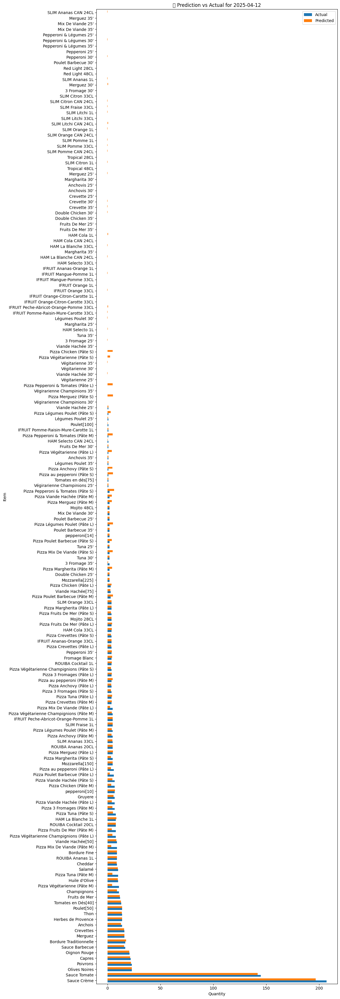

In [35]:
import matplotlib.pyplot as plt

# Choose a test date
target_date = pd.to_datetime("2025-04-12")

# Extract actual and predicted values
actual = Y_test.loc[target_date]
predicted = pd.Series(Y_pred[Y_test.index.get_loc(target_date)], index=Y_test.columns)

# Build comparison DataFrame
comparison_df = pd.DataFrame({
    "Actual": actual,
    "Predicted": predicted
}).sort_values("Actual", ascending=False)

# Plot
plt.figure(figsize=(12, len(comparison_df) * 0.2))
comparison_df.plot(kind='barh', figsize=(12, len(comparison_df) * 0.2), width=0.7)
plt.title(f"📅 Prediction vs Actual for {target_date.date()}")
plt.xlabel("Quantity")
plt.ylabel("Item")
plt.tight_layout()
plt.show()


##  Per-Target Error Metrics: Daily Forecasting Evaluation

To assess model performance across all forecasted targets (pizza variants and ingredients), we compute error metrics individually:

- **MAE (Mean Absolute Error)**: average absolute deviation per target
- **RMSE (Root Mean Squared Error)**: penalizes larger errors, useful for volatility detection

We iterate over each target column in `Y_test`, compare against predictions in `Y_pred`, and store results in a sorted DataFrame (`metrics_df`). This helps identify which items are forecasted accurately and which may need feature refinement or separate modeling.


In [36]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd

metrics = {}

for i, col in enumerate(Y_test.columns):
    y_true = Y_test[col]
    y_pred = Y_pred[:, i]

    mae = mean_absolute_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred, squared=False)

    metrics[col] = {
        "MAE": round(mae, 2),
        "RMSE": round(rmse, 2),
    }

metrics_df = pd.DataFrame(metrics).T.sort_values("MAE", ascending=False)


c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: 

C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\576043858.py:7: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\haithem0\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


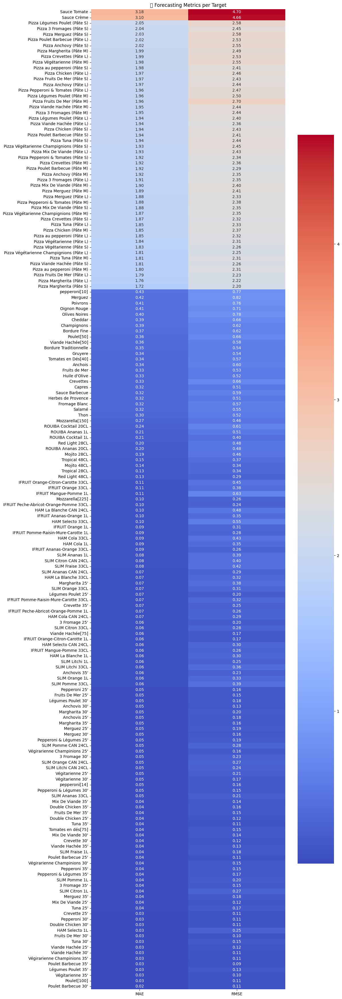

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, len(metrics_df) * 0.2))
sns.heatmap(metrics_df, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("📊 Forecasting Metrics per Target")
plt.tight_layout()
plt.show()


# Weekly Ingredient Forecasting Module


##  Weekly Index Assignment for Aggregation

To enable weekly ingredient forecasting, we assign each daily record to its corresponding week:

- Convert the datetime index to a weekly period using `.to_period("W")`
- Extract the start date of each week via `.start_time`
- Store this in a new column `week` for grouping and aggregation

This prepares the dataset for weekly rollups of ingredient and variant demand, aligned with operational prep cycles.


In [38]:
full_df["week"] = full_df.index.to_period("W").start_time


C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\3527903218.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_df["week"] = full_df.index.to_period("W").start_time


##  Weekly Forecast Targets and Feature Isolation

To prepare for weekly forecasting, we isolate:

- **Targets**: All ingredient and pizza variant columns (same as daily, but aggregated weekly)
- **Features**: All remaining columns in `full_df`, excluding targets

This separation ensures clean input/output structure for supervised learning and supports modular forecasting across time granularities.


In [39]:
targets = ingredient_pivot.columns.tolist() + variant_pivot.columns.tolist()
features = [col for col in full_df.columns if col not in targets]


##  Weekly Forecasting Model: Ingredient & Variant Demand

To support weekly prep planning and bulk purchasing, we train a multi-output regression model for weekly ingredient and pizza variant demand:

**Steps:**
- **Feature Aggregation**: Group numeric features by week using `.mean()` to capture weekly context
- **Target Aggregation**: Sum ingredient and variant quantities by week
- **Lag Alignment**: Shift features by one week to preserve causal structure (predict week N using week N–1)
- **Model Setup**: Use `XGBRegressor` wrapped in `MultiOutputRegressor` to forecast all targets simultaneously

This model enables scalable weekly forecasting across all prep items, aligned with operational cycles.


In [43]:
# Filter numeric-only features
numeric_features = full_df[features].select_dtypes(include=["number"]).columns.tolist()

# Aggregate weekly
X_weekly = full_df[numeric_features].groupby(full_df["week"]).mean()
Y_weekly = full_df[targets].groupby(full_df["week"]).sum()

X_weekly.columns = X_weekly.columns.map(lambda x: str(x).replace("[", "(").replace("]", ")").replace("<", "_"))

X_weekly_lagged = X_weekly.shift(1).dropna()
Y_weekly_aligned = Y_weekly.loc[X_weekly_lagged.index]
from sklearn.multioutput import MultiOutputRegressor
from xgboost import XGBRegressor

model_weekly = MultiOutputRegressor(XGBRegressor(n_estimators=100, max_depth=5, learning_rate=0.1))
model_weekly.fit(X_weekly_lagged, Y_weekly_aligned)


MultiOutputRegressor(estimator=XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            feature_weights=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.1, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=5,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None, ...))

##  Weekly Forecast Evaluation: Per-Target Error Metrics

To assess the accuracy of weekly ingredient and variant forecasts, we compute:

- **MAE (Mean Absolute Error)**: average deviation from actual weekly demand
- **RMSE (Root Mean Squared Error)**: penalizes larger errors, useful for volatility detection

We iterate over each target in `Y_weekly`, compare against predictions from `model_weekly`, and visualize the results using a heatmap. This diagnostic highlights which items are forecasted reliably and which may require feature refinement or separate modeling.


In [45]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd

# Predict weekly
Y_weekly_pred = model_weekly.predict(X_weekly)

# Compute metrics
weekly_metrics = {}

for i, col in enumerate(Y_weekly.columns):
    y_true = Y_weekly[col]
    y_pred = Y_weekly_pred[:, i]

    mae = mean_absolute_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    r2 = r2_score(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / np.maximum(y_true, 1))) * 100  # avoid div by zero

    weekly_metrics[col] = {
        "MAE": round(mae, 2),
        "RMSE": round(rmse, 2),
    }

weekly_metrics_df = pd.DataFrame(weekly_metrics).T.sort_values("MAE", ascending=False)


c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\haithem0\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_regression.py:492: 

C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\1226051757.py:7: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\haithem0\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


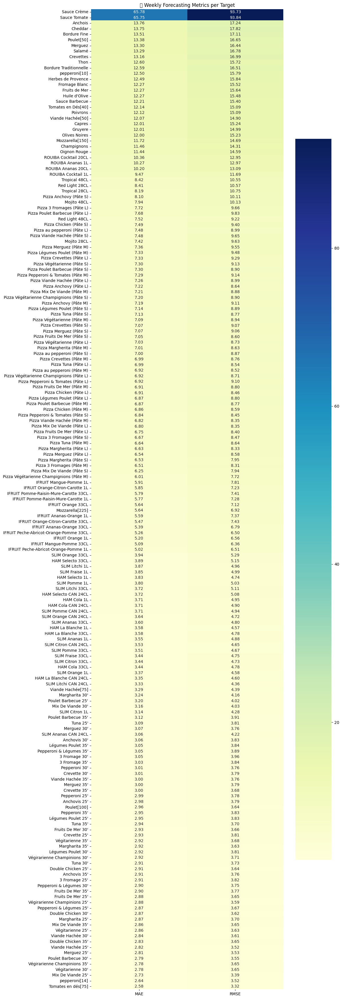

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, len(weekly_metrics_df) * 0.2))
sns.heatmap(weekly_metrics_df, annot=True, fmt=".2f", cmap="YlGnBu", cbar=True)
plt.title("📊 Weekly Forecasting Metrics per Target")
plt.tight_layout()
plt.show()


## Weekly Forecast Accuracy: Random Week Diagnostic

To evaluate model performance on a randomly selected week (post `2024-10-25`), we compare predicted vs actual quantities for all pizza variants and ingredients:

- Randomly select a test week from `Y_weekly`
- Extract actual and predicted values
- Compute absolute error per item
- Visualize using a horizontal bar chart sorted by error magnitude

This diagnostic helps identify high-error items and guides model refinement or operational adjustments for weekly prep planning.


C:\Users\haithem0\AppData\Local\Temp\ipykernel_28648\1241821621.py:21: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


<Figure size 1200x3500 with 0 Axes>

C:\Users\haithem0\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


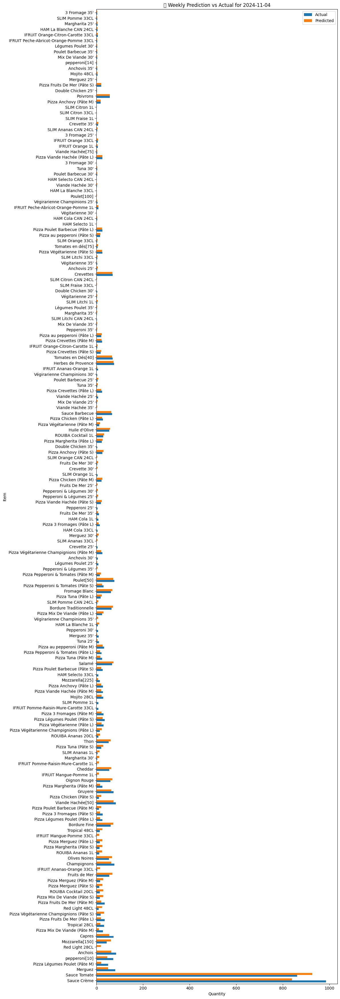

In [47]:
import random

# Get test weeks
test_weeks = Y_weekly.index[Y_weekly.index >= pd.to_datetime("2024-10-25")]
random_week = random.choice(test_weeks)
actual_week = Y_weekly.loc[random_week]
predicted_week = pd.Series(Y_weekly_pred[Y_weekly.index.get_loc(random_week)], index=Y_weekly.columns)

weekly_comparison_df = pd.DataFrame({
    "Actual": actual_week,
    "Predicted": predicted_week,
    "Error": (actual_week - predicted_week).abs().round(2)
}).sort_values("Error", ascending=False)
import matplotlib.pyplot as plt

plt.figure(figsize=(12, len(weekly_comparison_df) * 0.2))
weekly_comparison_df[["Actual", "Predicted"]].plot(kind='barh', figsize=(12, len(weekly_comparison_df) * 0.2), width=0.7)
plt.title(f"📅 Weekly Prediction vs Actual for {random_week.date()}")
plt.xlabel("Quantity")
plt.ylabel("Item")
plt.tight_layout()
plt.show()
